# ============================================================
#                       A S S I G N M E N T   2
# ============================================================
---

## Dataset source: https://data.worldbank.org/topic/climate-change

# Importing relevant libraries
---

In [1]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import seaborn as sns # TBU
import matplotlib.pyplot as plt
from pprint import pprint
from IPython.display import Markdown, display
plt.rcParams['figure.dpi'] = 600
plt.rcParams['savefig.dpi'] = 600
sns.set(rc={"figure.dpi":600, 'savefig.dpi':600})
sns.set_context('notebook')
sns.set_style("ticks")

## Defining Functions
---

In [2]:

def load_dataset(csv_file):
    """
    Parameters
    ----------
    csv_file : csv
        input dataset.

    Returns
    -------
    datadrame
        returns original dataframe.
    dataframe
        returns transposed dataframe.

    """
    data = pd.read_csv(csv_file,skiprows=4) # real data starts from 4th row
    data.drop(['Unnamed: 66'], axis=1, inplace=True) # removing garbage columns
    return data.copy() , data.T

def EDA_missing_plot(x,y, title, xlab, ylab):
    """   
    Parameters
    ----------
    x : series
        x axis values of the plot.
    y : series
        y axis values of the plot.
    title : string
        title of the plot.
    xlab : string
        x label of the plot.
    ylab : string
        y label of the plot.

    Returns
    -------
    None.

    """
    plt.figure(figsize=(20,10))
    fig, ax = plt.subplots(figsize=(20,10))
    plt.title(title, fontsize=20)
    plt.xlabel(xlab,labelpad=25, fontsize=20)
    plt.ylabel(ylab, fontsize=20)
    plt.xticks(rotation=90)
#     plt.tight_layout()
    plt.stem(x,y)
    for index in range(len(x)):
        ax.text(x[index], y[index]+0.015, round(y[index],2),rotation=90, size=10)
    plt.savefig(f'{title}.png')
    plt.show()
    

def EDA_box_plot(x, y, data, title, xlab, ylab):
    """ 
    Parameters
    ----------
    x : series
        x axis values of the plot.
    y : series
        y axis values of the plot.
    data : dataframe
        input dataframe for the sns.boxplot.
    title : string
        title of the plot.
    xlab : string
        y label of the plot.
    ylab : string
        x label of the plot.

    Returns
    -------
    None.

    """
    plt.figure(figsize=(20,30))
    plt.xticks(rotation=90)
    p=sns.boxplot(x=x, y=y, data=data)
    p.set_title(title, fontsize=20)
    p.set_xlabel(xlab, fontsize=20)
    p.set_ylabel(ylab, fontsize=20)
    plt.savefig(f'{title}.png')
    plt.show()
    
    
def generate_country(data,G20_list,group='G20'):
    """  
    Parameters
    ----------
    data : dataframe
        input dataframe to be filtered.
    G20_list : list
        list fo G20 group of countries.

    Returns
    -------
    dataframe
        subset of the data frame with the G20 group of countries.

    """
    """
    function to filter out G20 nations for further analysis 
    """
    if group=="G20":  return data[data['Country Name'].isin(G20_list)]
    if group=="Rest": return data[~data['Country Name'].isin(G20_list)]

def fill_missing_row(data):    
    temp = data[years]
    temp = temp.apply(lambda row: row.fillna(row.mean()), axis=1) # filling missing values by row mean
    for x in years:
        data[x] = temp[x]
    return data    

## Generating datasets
---

In [3]:
csv_file = 'dataset/API_19_DS2_en_csv_v2_4028487.csv'
data_original, data_transposed = load_dataset(csv_file)
print(f"Initial Country count: {len(data_original['Country Name'].drop_duplicates().tolist())}")
print("-"*50)


Initial Country count: 266
--------------------------------------------------


In [4]:
pprint(sorted(data_original['Country Name'].drop_duplicates().tolist()))

['Afghanistan',
 'Africa Eastern and Southern',
 'Africa Western and Central',
 'Albania',
 'Algeria',
 'American Samoa',
 'Andorra',
 'Angola',
 'Antigua and Barbuda',
 'Arab World',
 'Argentina',
 'Armenia',
 'Aruba',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahamas, The',
 'Bahrain',
 'Bangladesh',
 'Barbados',
 'Belarus',
 'Belgium',
 'Belize',
 'Benin',
 'Bermuda',
 'Bhutan',
 'Bolivia',
 'Bosnia and Herzegovina',
 'Botswana',
 'Brazil',
 'British Virgin Islands',
 'Brunei Darussalam',
 'Bulgaria',
 'Burkina Faso',
 'Burundi',
 'Cabo Verde',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Caribbean small states',
 'Cayman Islands',
 'Central African Republic',
 'Central Europe and the Baltics',
 'Chad',
 'Channel Islands',
 'Chile',
 'China',
 'Colombia',
 'Comoros',
 'Congo, Dem. Rep.',
 'Congo, Rep.',
 'Costa Rica',
 "Cote d'Ivoire",
 'Croatia',
 'Cuba',
 'Curacao',
 'Cyprus',
 'Czech Republic',
 'Denmark',
 'Djibouti',
 'Dominica',
 'Dominican Republic',
 'Early-demographic dividend',

## Removing "Not classified" entires from **"Country Name"** feature 
---
There are 76 **"Not classified"** entries which are inconsistent and do not add meanigful insights to our analysis.

In [5]:
print(f"'Not classified' Country entries: {data_original[data_original['Country Name']== 'Not classified'].shape[0]}")

data_original   = data_original[data_original['Country Name']!= 'Not classified']
data_transposed = data_transposed.drop(columns=data_transposed.columns[(data_transposed == 'Not classified').any()])

print(f"New Country count: {len(data_original['Country Name'].drop_duplicates().tolist())}")

'Not classified' Country entries: 76
New Country count: 265


In [6]:
data_original.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Aruba,ABW,Urban population (% of total population),SP.URB.TOTL.IN.ZS,50.776,50.761000,50.746000,50.730000,50.715000,50.700000,...,42.957000,42.990000,43.041000,43.108000,43.192000,43.293000,43.411000,43.546000,43.697000,NaN
1,Aruba,ABW,Urban population,SP.URB.TOTL,27525.000,28139.000000,28537.000000,28763.000000,28922.000000,29080.000000,...,44059.000000,44351.000000,44666.000000,44978.000000,45293.000000,45614.000000,45949.000000,46294.000000,46654.000000,NaN
2,Aruba,ABW,Urban population growth (annual %),SP.URB.GROW,NaN,2.206183,1.404498,0.788835,0.551271,0.544810,...,0.543931,0.660561,0.707733,0.696090,0.697901,0.706219,0.731740,0.748028,0.774631,NaN
3,Aruba,ABW,"Population, total",SP.POP.TOTL,54208.000,55434.000000,56234.000000,56699.000000,57029.000000,57357.000000,...,102565.000000,103165.000000,103776.000000,104339.000000,104865.000000,105361.000000,105846.000000,106310.000000,106766.000000,NaN
4,Aruba,ABW,Population growth (annual %),SP.POP.GROW,NaN,2.236462,1.432843,0.823502,0.580334,0.573498,...,0.503385,0.583290,0.590508,0.541048,0.502860,0.471874,0.459266,0.437415,0.428017,NaN


# Exploratory Data Analaysis (EDA)
---

In [7]:
# sns.set_theme(style="whitegrid")

years=[str(x) for x in list(range(1960,2022))]

# dist = pd.DataFrame(columns = ['Indicator Code']+years+['Values'])
dist = pd.DataFrame()
box=data_original[years].copy()
# box=(box-box.min())/(box.max()-box.min())
# box=box.apply(lambda x: x/x.max(), axis=1)

dist['Indicator Code'] = data_original['Indicator Code']
for x in years:
    dist[x] = box[x]
dist['Values']=box.sum(axis='columns')

EDA_box_plot('Values',
             'Indicator Code',
             dist,
             'Box plot for all the Climate Change indicators',
             'Yearly Values',
             'Climate Change indicators')
# dist.head()

del box  # ensuring memory efficiency
del dist # ensuring memory efficiency

#### Observation:

Majority of the outliers are observed in the **"Electricity production from renewable sources, excluding hydroelectric (kWh) [EG.ELC.RNWX.KH]"** indicator, indicating that the variance in global energy production from renewable sources is greater.

---

## Observing Missing Values

In [8]:
data_transposed.columns = data_transposed.loc['Indicator Code'] # setting column names as indicators

# Considering best indicators for analysis.
data_transposed_na = data_transposed.loc['1960':]

temp_1 = data_transposed_na.isna().sum()/len(data_transposed_na)
temp_1 = temp_1.groupby('Indicator Code').sum()/265
temp_1 = temp_1.sort_values()

EDA_missing_plot(temp_1.index,
                 temp_1.values,
                 'Missing values per indicator for all Countries combined',
                 'Indicators',
                 'Missing Value Percentage')

temp_2 =data_transposed_na.T.isna().sum()/len(data_transposed_na.T)
temp_2 = temp_2.groupby(level=0).sum()

display(Markdown('---'))

EDA_missing_plot(temp_2.index,
                 temp_2.values,
                 'Missing values per year for all indicators combined',
                 'Years',
                 'Missing Value percentage')

del temp_1 # ensuring memory efficiency
del temp_2 # ensuring memory efficiency

<Figure size 12000x6000 with 0 Axes>

---

<Figure size 12000x6000 with 0 Axes>

#### Observation: 

 As can be seen from the above two graphs, the current dataset contains a large number of missing values, and the dataset has undergone a significant shift since 1990. **It is likely that the World Bank began considering and monitoring additional indicators after 1990 for more countries**.
 
---
 



# Analysis
---
## I will use a few indicators and G20 countries for further analysais.

### For this assignemnt, I will be considering the following G20 nations:
- Argentina
- Australia
- Brazil
- Canada
- China
- France
- Germany
- India
- Indonesia
- Italy
- Japan
- Republic of Korea
- Mexico
- Russia
- Saudi Arabia
- South Africa
- Turkey
- the United Kingdom
- the United States
- European Union

In [9]:
G20_list = ['Argentina',
            'Australia',
             'Brazil',
             'Canada',
             'China',
             'European Union',
             'France',
             'Germany',
             'India',
             'Indonesia',
             'Italy',
             'Japan',
             'Korea, Rep.',
             'Mexico',
             'Russian Federation',
             'Saudi Arabia',
             'South Africa',
             'Turkey',
             'United Kingdom',
             'United States']
G20 = generate_country(data_original,G20_list,'G20')
G20 = G20.drop('Country Code',axis =1)
G20 = G20.drop('Indicator Name',axis =1)

In [10]:
sorted(G20['Country Name'].drop_duplicates().tolist())

['Argentina',
 'Australia',
 'Brazil',
 'Canada',
 'China',
 'European Union',
 'France',
 'Germany',
 'India',
 'Indonesia',
 'Italy',
 'Japan',
 'Korea, Rep.',
 'Mexico',
 'Russian Federation',
 'Saudi Arabia',
 'South Africa',
 'Turkey',
 'United Kingdom',
 'United States']

In [11]:
G20.head()

,Country Name,Indicator Code,1960,1961,1962,1963,1964,1965,1966,1967,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
684,Argentina,SP.URB.TOTL.IN.ZS,7.361100e+01,7.421700e+01,7.476700e+01,7.530900e+01,7.584400e+01,7.636900e+01,7.688800e+01,7.739800e+01,...,9.112100e+01,9.124900e+01,9.137700e+01,9.150300e+01,9.162700e+01,9.174900e+01,9.187000e+01,9.199100e+01,9.211100e+01,NaN
685,Argentina,SP.URB.TOTL,1.507684e+07,1.544995e+07,1.581550e+07,1.618309e+07,1.655252e+07,1.692310e+07,1.729521e+07,1.766909e+07,...,3.802777e+07,3.850976e+07,3.899011e+07,3.946704e+07,3.994055e+07,4.041067e+07,4.087710e+07,4.133957e+07,4.179699e+07,NaN
686,Argentina,SP.URB.GROW,NaN,2.444590e+00,2.338419e+00,2.297659e+00,2.257149e+00,2.214126e+00,2.175015e+00,2.138714e+00,...,1.280774e+00,1.259482e+00,1.239639e+00,1.215797e+00,1.192603e+00,1.170196e+00,1.147602e+00,1.125020e+00,1.100415e+00,NaN
687,Argentina,SP.POP.TOTL,2.048178e+07,2.081727e+07,2.115304e+07,2.148892e+07,2.182443e+07,2.215964e+07,2.249403e+07,2.282887e+07,...,4.173327e+07,4.220294e+07,4.266950e+07,4.313197e+07,4.359037e+07,4.404481e+07,4.449450e+07,4.493871e+07,4.537676e+07,NaN
688,Argentina,SP.POP.GROW,NaN,1.624717e+00,1.600079e+00,1.575354e+00,1.549258e+00,1.524295e+00,1.497719e+00,1.477607e+00,...,1.136906e+00,1.119109e+00,1.099461e+00,1.078001e+00,1.057182e+00,1.037134e+00,1.015808e+00,9.933975e-01,9.700540e-01,NaN


## 1) G20 Nations comparison between $CO_{2}$ emission generated by: 

---

- Solid fuel consumption (KT) [EN.ATM.CO2E.SF.KT]
- Liquid fuel consumption (KT) [EN.ATM.CO2E.LF.KT]
- Gaseous fuel consumption (KT) [EN.ATM.CO2E.GF.KT] 

In [12]:
G20_CO2_SLG = G20[(G20["Indicator Code"]=='EN.ATM.CO2E.GF.KT') | (G20["Indicator Code"]=='EN.ATM.CO2E.LF.KT')| (G20["Indicator Code"]=='EN.ATM.CO2E.SF.KT')]

In [13]:
G20_CO2_SLG.head()

,Country Name,Indicator Code,1960,1961,1962,1963,1964,1965,1966,1967,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
722,Argentina,EN.ATM.CO2E.SF.KT,3909.022,3542.322,2009.516,2306.543,2559.566,2603.570,2588.902,2940.934,...,5012.789,4235.385,4176.713,4008.031,3010.607,NaN,NaN,NaN,NaN,NaN
727,Argentina,EN.ATM.CO2E.LF.KT,41224.414,42155.832,45115.101,40678.031,45247.113,47362.972,48609.752,49812.528,...,85657.453,90835.257,87586.295,91623.662,88792.738,NaN,NaN,NaN,NaN,NaN
731,Argentina,EN.ATM.CO2E.GF.KT,2365.215,4033.700,5111.798,5834.197,6472.255,7253.326,7854.714,8214.080,...,95459.344,90835.257,96691.456,98359.941,102268.963,NaN,NaN,NaN,NaN,NaN
1026,Australia,EN.ATM.CO2E.SF.KT,58976.361,60021.456,61535.927,63780.131,67190.441,71117.798,71458.829,75466.860,...,195443.766,174835.226,163449.191,169199.047,172598.356,NaN,NaN,NaN,NaN,NaN
1031,Australia,EN.ATM.CO2E.LF.KT,27832.530,29137.982,31910.234,35687.244,39977.634,47946.025,47032.942,51884.383,...,122514.470,123412.885,120196.926,117178.985,118909.809,NaN,NaN,NaN,NaN,NaN


In [14]:
G20_CO2_SLG.isnull().mean().round(4).mul(100).sort_values(ascending=False)

2021              100.0
2020              100.0
2017              100.0
2018              100.0
2019              100.0
                  ...  
1993                0.0
1992                0.0
1991                0.0
Indicator Code      0.0
Country Name        0.0
Length: 64, dtype: float64

### Data preprocessing: Filling missing values
---

In [15]:
# temp = G20_CO2_SLG[years]
# temp = temp.apply(lambda row: row.fillna(row.mean()), axis=1) # filling missing values by row mean
# for x in years:
#     G20_CO2_SLG[x] = temp[x]
# del temp # ensuring memory efficiency

G20_CO2_SLG = fill_missing_row(G20_CO2_SLG)

In [16]:
G20_CO2_SLG.head()

,Country Name,Indicator Code,1960,1961,1962,1963,1964,1965,1966,1967,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
722,Argentina,EN.ATM.CO2E.SF.KT,3909.022,3542.322,2009.516,2306.543,2559.566,2603.570,2588.902,2940.934,...,5012.789,4235.385,4176.713,4008.031,3010.607,3070.823000,3070.823000,3070.823000,3070.823000,3070.823000
727,Argentina,EN.ATM.CO2E.LF.KT,41224.414,42155.832,45115.101,40678.031,45247.113,47362.972,48609.752,49812.528,...,85657.453,90835.257,87586.295,91623.662,88792.738,67510.306333,67510.306333,67510.306333,67510.306333,67510.306333
731,Argentina,EN.ATM.CO2E.GF.KT,2365.215,4033.700,5111.798,5834.197,6472.255,7253.326,7854.714,8214.080,...,95459.344,90835.257,96691.456,98359.941,102268.963,43516.417667,43516.417667,43516.417667,43516.417667,43516.417667
1026,Australia,EN.ATM.CO2E.SF.KT,58976.361,60021.456,61535.927,63780.131,67190.441,71117.798,71458.829,75466.860,...,195443.766,174835.226,163449.191,169199.047,172598.356,136982.200333,136982.200333,136982.200333,136982.200333,136982.200333
1031,Australia,EN.ATM.CO2E.LF.KT,27832.530,29137.982,31910.234,35687.244,39977.634,47946.025,47032.942,51884.383,...,122514.470,123412.885,120196.926,117178.985,118909.809,81519.082667,81519.082667,81519.082667,81519.082667,81519.082667


### Data Preprocesing: Feature Engineering
---

In [17]:
A_1_dataset = G20_CO2_SLG.melt(id_vars=["Country Name", "Indicator Code"], 
                               var_name="Year", 
                               value_name="Value")

In [18]:
A_1_dataset.head()

,Country Name,Indicator Code,Year,Value
0,Argentina,EN.ATM.CO2E.SF.KT,1960,3909.022
1,Argentina,EN.ATM.CO2E.LF.KT,1960,41224.414
2,Argentina,EN.ATM.CO2E.GF.KT,1960,2365.215
3,Australia,EN.ATM.CO2E.SF.KT,1960,58976.361
4,Australia,EN.ATM.CO2E.LF.KT,1960,27832.530


In [19]:
A_1_dataset = A_1_dataset.astype({'Year':int})
bins = np.arange(0,A_1_dataset['Year'].max() + 5, 5)
A_1_dataset['bins'] = pd.cut(A_1_dataset['Year'], bins)
A_1_dataset.head()


,Country Name,Indicator Code,Year,Value,bins
0,Argentina,EN.ATM.CO2E.SF.KT,1960,3909.022,"(1955, 1960]"
1,Argentina,EN.ATM.CO2E.LF.KT,1960,41224.414,"(1955, 1960]"
2,Argentina,EN.ATM.CO2E.GF.KT,1960,2365.215,"(1955, 1960]"
3,Australia,EN.ATM.CO2E.SF.KT,1960,58976.361,"(1955, 1960]"
4,Australia,EN.ATM.CO2E.LF.KT,1960,27832.530,"(1955, 1960]"


In [20]:
A_1_dataset['bins']

0       (1955, 1960]
1       (1955, 1960]
2       (1955, 1960]
3       (1955, 1960]
4       (1955, 1960]
            ...     
3715    (2020, 2025]
3716    (2020, 2025]
3717    (2020, 2025]
3718    (2020, 2025]
3719    (2020, 2025]
Name: bins, Length: 3720, dtype: category
Categories (405, interval[int64]): [(0, 5] < (5, 10] < (10, 15] < (15, 20] ... (2005, 2010] < (2010, 2015] < (2015, 2020] < (2020, 2025]]

In [21]:
A_1_dataset = A_1_dataset.astype({'bins':str})
A_1_dataset['Value'] = A_1_dataset.groupby(['bins','Country Name','Indicator Code']).Value.transform('sum')


In [22]:
A_1_dataset.head()

,Country Name,Indicator Code,Year,Value,bins
0,Argentina,EN.ATM.CO2E.SF.KT,1960,3909.022,"(1955, 1960]"
1,Argentina,EN.ATM.CO2E.LF.KT,1960,41224.414,"(1955, 1960]"
2,Argentina,EN.ATM.CO2E.GF.KT,1960,2365.215,"(1955, 1960]"
3,Australia,EN.ATM.CO2E.SF.KT,1960,58976.361,"(1955, 1960]"
4,Australia,EN.ATM.CO2E.LF.KT,1960,27832.530,"(1955, 1960]"


In [23]:
g = sns.FacetGrid(A_1_dataset, hue="Indicator Code", col="Country Name", col_wrap=5)
g.map(sns.scatterplot, "bins", "Value")
g.add_legend()
for axes in g.axes.flat:
    _ = axes.set_xticklabels(axes.get_xticklabels(), rotation=90)
g.tight_layout()
for ax in g.axes.flat:
    ax.yaxis.set_major_formatter(lambda y, p: f'{y/1000000:.2f}M kt')

g.fig.subplots_adjust(top=0.9)
g.fig.suptitle('Comparison of Co2 emission from consumption of solid, liquid and gas fuel, binned into 5 years gap starting from 1960')
g.savefig("output.png")

#### Observation:

On an average $CO_{2}$ emissions from liquid fuel consumption is far greater than $CO_{2}$ emissions from solid or gaseous fuel. we can also see that China generated a whopping amount of $CO_{2}$ between 2012-2015. Overall we can see that 20 has significantly reduced the $CO_{2}$ emissions by 2021.

## 2) USA, China, India  $Co_{2}$ emissions vs the rest of the G20 nation in last 5 years 2016 -2021

In [24]:
REST_G20=G20[(G20["Indicator Code"]=='EN.ATM.CO2E.KT')&
             ~((G20['Country Name']=='United States')|
              (G20['Country Name']=='China')|
              (G20['Country Name']=='India')
             )]

USA  = G20[(G20['Country Name']=='United States') &(G20["Indicator Code"]=='EN.ATM.CO2E.KT')]
China= G20[(G20['Country Name']=='China')&(G20["Indicator Code"]=='EN.ATM.CO2E.KT')]
India= G20[(G20['Country Name']=='India')&(G20["Indicator Code"]=='EN.ATM.CO2E.KT')]

REST_G20=fill_missing_row(REST_G20)
USA=fill_missing_row(USA)
China=fill_missing_row(China)
India=fill_missing_row(India)

REST_G20.reset_index()
USA.reset_index()
India.reset_index()
China.reset_index()

REST_G20['last_5'] = REST_G20[[str(x) for x in list(range(2016,2022))]].mean(axis=1)
USA['last_5'] = USA[[str(x) for x in list(range(2016,2022))]].mean(axis=1)
India['last_5'] = India[[str(x) for x in list(range(2016,2022))]].mean(axis=1)
China['last_5'] = China[[str(x) for x in list(range(2016,2022))]].mean(axis=1)

In [25]:
REST_G20.head(20)

,Country Name,Indicator Code,1960,1961,1962,1963,1964,1965,1966,1967,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,last_5
728,Argentina,EN.ATM.CO2E.KT,1.456383e+05,1.456383e+05,1.456383e+05,1.456383e+05,1.456383e+05,1.456383e+05,1.456383e+05,1.456383e+05,...,184000.0,179910.0,186090.0,184280.0,180120.0,177410.0,1.456383e+05,1.456383e+05,1.456383e+05,1.631208e+05
1032,Australia,EN.ATM.CO2E.KT,3.452714e+05,3.452714e+05,3.452714e+05,3.452714e+05,3.452714e+05,3.452714e+05,3.452714e+05,3.452714e+05,...,379270.0,369880.0,375970.0,383960.0,387200.0,386620.0,3.452714e+05,3.452714e+05,3.452714e+05,3.655990e+05
2248,Brazil,EN.ATM.CO2E.KT,3.381928e+05,3.381928e+05,3.381928e+05,3.381928e+05,3.381928e+05,3.381928e+05,3.381928e+05,3.381928e+05,...,482860.0,506780.0,479970.0,441910.0,449840.0,427710.0,3.381928e+05,3.381928e+05,3.381928e+05,3.890064e+05
2704,Canada,EN.ATM.CO2E.KT,5.120697e+05,5.120697e+05,5.120697e+05,5.120697e+05,5.120697e+05,5.120697e+05,5.120697e+05,5.120697e+05,...,556350.0,561830.0,558800.0,550480.0,562260.0,574400.0,5.120697e+05,5.120697e+05,5.120697e+05,5.372248e+05
4224,Germany,EN.ATM.CO2E.KT,8.173931e+05,8.173931e+05,8.173931e+05,8.173931e+05,8.173931e+05,8.173931e+05,8.173931e+05,8.173931e+05,...,777630.0,737490.0,742310.0,747150.0,732200.0,709540.0,8.173931e+05,8.173931e+05,8.173931e+05,7.735116e+05
5592,European Union,EN.ATM.CO2E.KT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5896,France,EN.ATM.CO2E.KT,3.530155e+05,3.530155e+05,3.530155e+05,3.530155e+05,3.530155e+05,3.530155e+05,3.530155e+05,3.530155e+05,...,336630.0,304530.0,310520.0,312710.0,316360.0,309960.0,3.530155e+05,3.530155e+05,3.530155e+05,3.330128e+05
6200,United Kingdom,EN.ATM.CO2E.KT,4.979445e+05,4.979445e+05,4.979445e+05,4.979445e+05,4.979445e+05,4.979445e+05,4.979445e+05,4.979445e+05,...,453060.0,414850.0,400370.0,378890.0,366380.0,358800.0,4.979445e+05,4.979445e+05,4.979445e+05,4.329839e+05
8100,Indonesia,EN.ATM.CO2E.KT,3.439786e+05,3.439786e+05,3.439786e+05,3.439786e+05,3.439786e+05,3.439786e+05,3.439786e+05,3.439786e+05,...,454320.0,490050.0,490840.0,494980.0,532920.0,583110.0,3.439786e+05,3.439786e+05,3.439786e+05,4.404910e+05
8860,Italy,EN.ATM.CO2E.KT,4.060352e+05,4.060352e+05,4.060352e+05,4.060352e+05,4.060352e+05,4.060352e+05,4.060352e+05,4.060352e+05,...,346450.0,327490.0,337860.0,333340.0,329190.0,324850.0,4.060352e+05,4.060352e+05,4.060352e+05,3.675809e+05


In [26]:
REST_CO2 = REST_G20['last_5'].sum()
USA_CO2  = USA['last_5'].sum()
India_CO2  = India['last_5'].sum()
China_CO2  = China['last_5'].sum()

total_CO2 = REST_CO2+USA_CO2+China_CO2+India_CO2
REST_CO2 /=total_CO2
USA_CO2 /=total_CO2
China_CO2 /=total_CO2
India_CO2 /=total_CO2

In [27]:
list(range(2016,2022))

[2016, 2017, 2018, 2019, 2020, 2021]

In [28]:
USA.head()

,Country Name,Indicator Code,1960,1961,1962,1963,1964,1965,1966,1967,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,last_5
19120,United States,EN.ATM.CO2E.KT,5.294306e+06,5.294306e+06,5.294306e+06,5.294306e+06,5.294306e+06,5.294306e+06,5.294306e+06,5.294306e+06,...,5089500.0,5102580.0,4982790.0,4888640.0,4813720.0,4981300.0,5.294306e+06,5.294306e+06,5.294306e+06,5.094430e+06


In [29]:
India.head()

,Country Name,Indicator Code,1960,1961,1962,1963,1964,1965,1966,1967,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,last_5
8328,India,EN.ATM.CO2E.KT,1.289541e+06,1.289541e+06,1.289541e+06,1.289541e+06,1.289541e+06,1.289541e+06,1.289541e+06,1.289541e+06,...,1966810.0,2136870.0,2150220.0,2183280.0,2301440.0,2434520.0,1.289541e+06,1.289541e+06,1.289541e+06,1.797977e+06


In [30]:
China.head()

,Country Name,Indicator Code,1960,1961,1962,1963,1964,1965,1966,1967,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,last_5
3084,China,EN.ATM.CO2E.KT,5.841868e+06,5.841868e+06,5.841868e+06,5.841868e+06,5.841868e+06,5.841868e+06,5.841868e+06,5.841868e+06,...,9936680.0,9894940.0,9830430.0,9814310.0,10017770.0,10313460.0,5.841868e+06,5.841868e+06,5.841868e+06,7.945190e+06


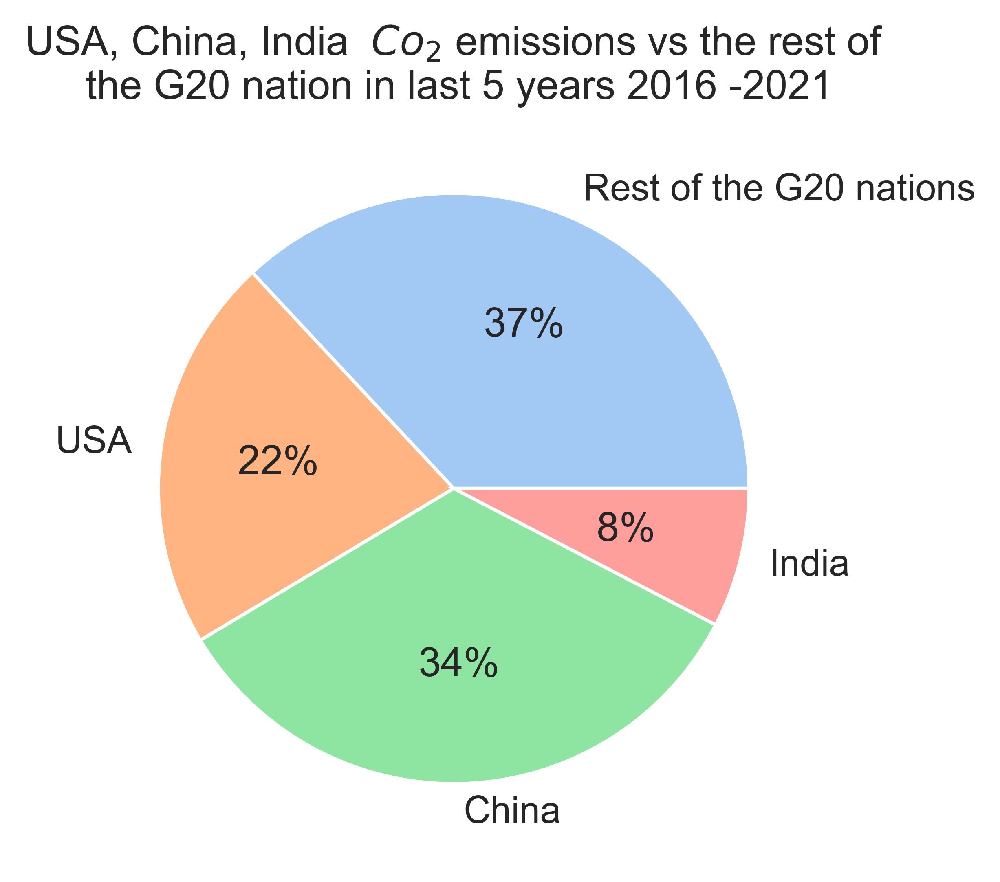

In [31]:
data = [REST_CO2, USA_CO2, China_CO2, India_CO2]
labels = ['Rest of the G20 nations', 'USA', 'China','India']

colors = sns.color_palette('pastel')[0:5]

plt.title('USA, China, India  $Co_{2}$ emissions vs the rest of\n the G20 nation in last 5 years 2016 -2021')
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%')
plt.savefig('USA, China, India  CO2 emissions vs the rest of the G20 nation in last 5 years 2016 -2021.png')
plt.show()

### Observation

Within the G20 Group of countries China has generated the highest amount of Co2 Emissions, followed by USA and then India. We can hypothesize that due to ill monitored practices, inspire of environmental policies, USA and China highly contribute to the Emission of Co2 in the G20 Group of countries.

## 3) Indicator Correlation Analysis for USA

In [32]:
USA  = G20[(G20['Country Name']=='United States')]
USA=fill_missing_row(USA)
USA.reset_index()
USA =USA.drop(['Country Name'],axis='columns')
cols = USA['Indicator Code'].tolist()
USA =USA.drop(['Indicator Code'],axis='columns')
USA = USA.T
"""
Cosidering a few indicators to observe correlation
Urban population
Mortality rate, under-5 (per 1,000 live births)
SF6 gas emissions (thousand metric tons of CO2 equivalent)
PFC gas emissions (thousand metric tons of CO2 equivalent)
Nitrous oxide emissions (thousand metric tons of CO2 equivalent)
CO2 emissions (kt)
Forest area (sq. km)

"""
names = ['Urban population',
'Mortality rate',
'SF6 gas emissions',
'PFC gas emissions',
'Nitrous oxide emissions',
'CO2 emissions',
'Forest area']
cosidered_indicators=['SP.URB.TOTL',
                      'SH.DYN.MORT',
                      'EN.ATM.SF6G.KT.CE',
                      'EN.ATM.PFCG.KT.CE',
                      'EN.ATM.NOXE.KT.CE',
                      'EN.ATM.CO2E.KT',
                      'AG.LND.FRST.K2']
USA.columns = cols
USA = USA[cosidered_indicators]

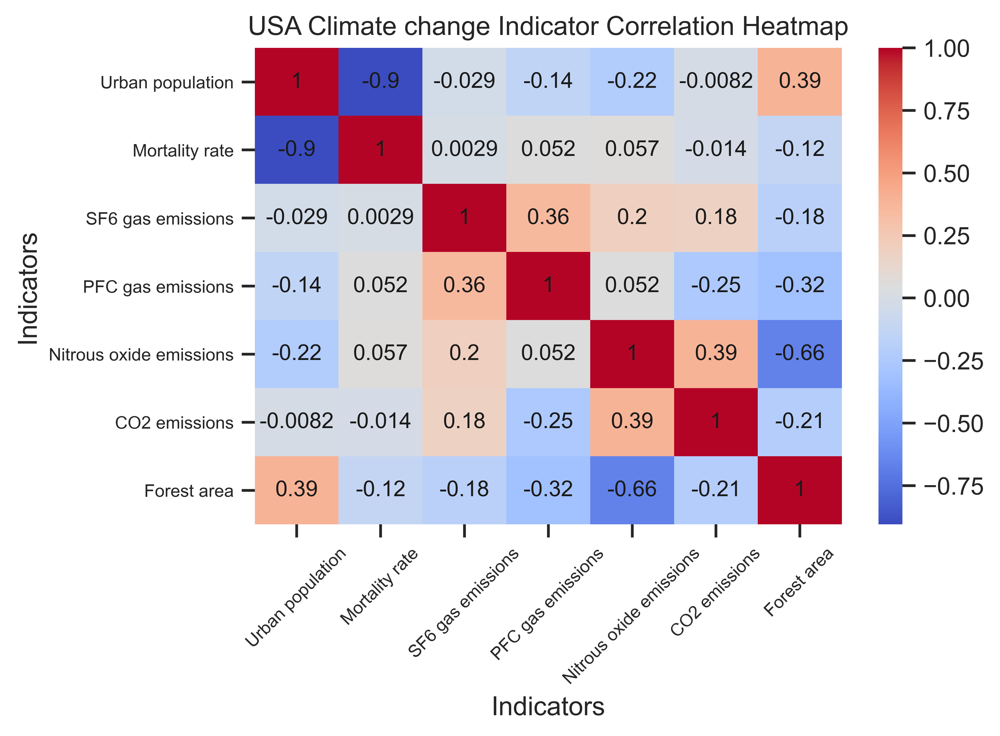

In [33]:
corrMatrix = USA.corr()

annot_kws={'fontsize':10, 
           'fontstyle':'normal',  
           'color':"k", 
           'verticalalignment':'center'}

p = sns.heatmap(corrMatrix,cmap="coolwarm",annot_kws=annot_kws,annot=True,xticklabels = names,yticklabels = names)
p.set(title="USA Climate change Indicator Correlation Heatmap",
      xlabel="Indicators",
      ylabel="Indicators")
p.set_yticklabels(p.get_yticklabels(), rotation = 0, fontsize = 8)
p.set_xticklabels(p.get_xticklabels(), rotation = 45, fontsize = 8)
# plt.savefig('USA Climate change Indicator Correlation Heatmap')
plt.show()

### Observation

We can clearly observe that there is a very high negative correlation between Urban Population and Mortality Rate. we can also observe that more forest areas yeild in less $NO_{2}$ Emissios

## 4) Indicator Correlation Analysis for Russia

In [34]:
RUS  = G20[(G20['Country Name']=='Russian Federation')]
RUS=fill_missing_row(RUS)
RUS.reset_index()
RUS =RUS.drop(['Country Name'],axis='columns')
cols = RUS['Indicator Code'].tolist()
RUS =RUS.drop(['Indicator Code'],axis='columns')
RUS = RUS.T
"""
Cosidering a few indicators to observe correlation
Urban population
Mortality rate, under-5 (per 1,000 live births)
SF6 gas emissions (thousand metric tons of CO2 equivalent)
PFC gas emissions (thousand metric tons of CO2 equivalent)
Nitrous oxide emissions (thousand metric tons of CO2 equivalent)
CO2 emissions (kt)
Forest area (sq. km)

"""
names = ['Urban population',
'Mortality rate',
'SF6 gas emissions',
'PFC gas emissions',
'Nitrous oxide emissions',
'CO2 emissions',
'Forest area']
cosidered_indicators=['SP.URB.TOTL',
                      'SH.DYN.MORT',
                      'EN.ATM.SF6G.KT.CE',
                      'EN.ATM.PFCG.KT.CE',
                      'EN.ATM.NOXE.KT.CE',
                      'EN.ATM.CO2E.KT',
                      'AG.LND.FRST.K2']
RUS.columns = cols
RUS = RUS[cosidered_indicators]

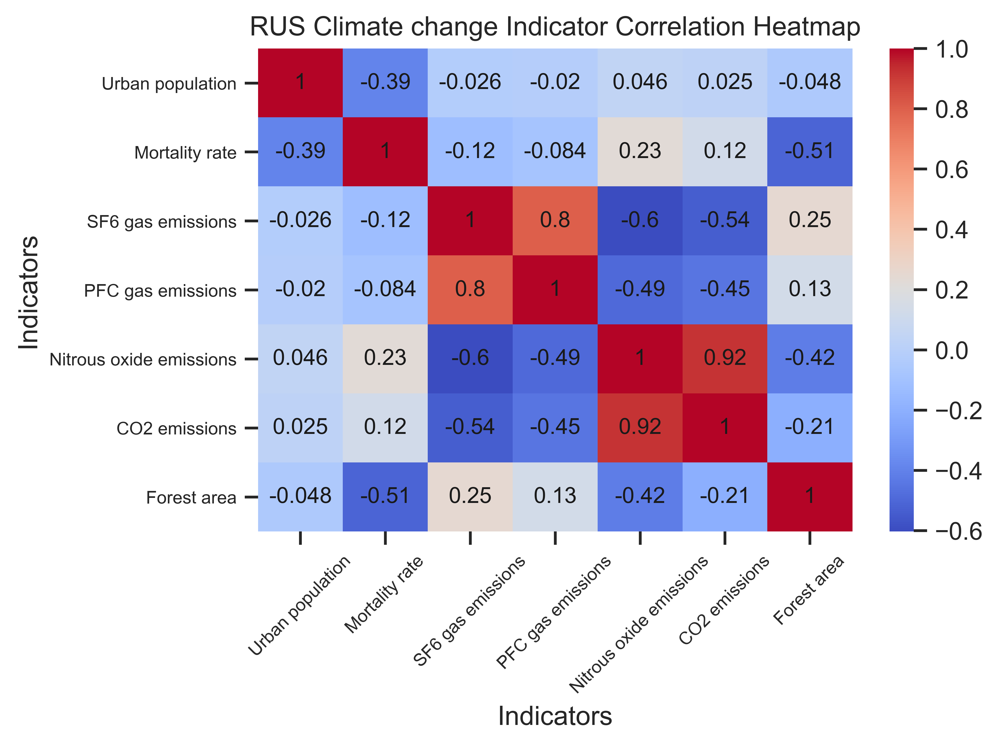

In [35]:
corrMatrix = RUS.corr()

annot_kws={'fontsize':10, 
           'fontstyle':'normal',  
           'color':"k", 
           'verticalalignment':'center'}

p = sns.heatmap(corrMatrix,cmap="coolwarm",annot_kws=annot_kws,annot=True,xticklabels = names,yticklabels = names)
p.set(title="RUS Climate change Indicator Correlation Heatmap",
      xlabel="Indicators",
      ylabel="Indicators")
p.set_yticklabels(p.get_yticklabels(), rotation = 0, fontsize = 8)
p.set_xticklabels(p.get_xticklabels(), rotation = 45, fontsize = 8)
# plt.savefig('RUS Climate change Indicator Correlation Heatmap')
plt.show()

### Observation

We can clearly observe that there is a very high positive correlation between $NO_{2}$ and $CO_{2}$. we can also observe that there is a very weak negate correlation between urban population and Mortality rate. we can deduce that, urbanization of the cities have not afftec the health standards

## 5) Mortality Histogram for USA

[Text(0.5, 1.0, 'USA Mortality Rate'),
 Text(0.5, 0, 'Mortality rate, under-5 (per 1,000 live births)'),
 Text(0, 0.5, 'Count')]

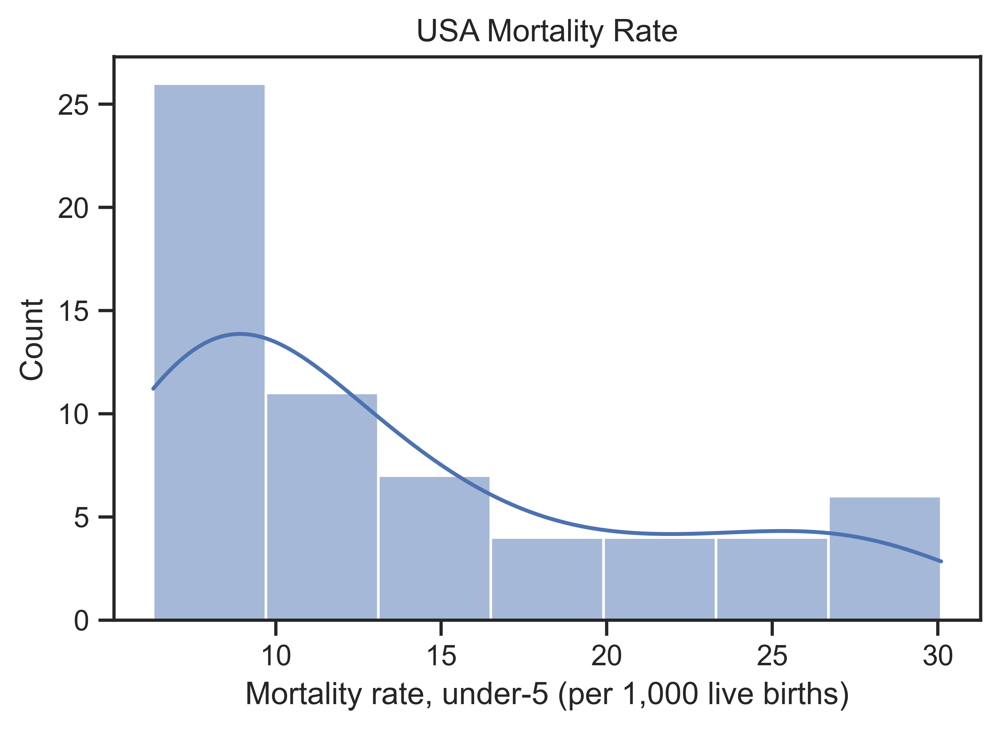

In [36]:
p = sns.histplot(data=USA, x="SH.DYN.MORT",kde=True)
p.set(title="USA Mortality Rate",
      xlabel="Mortality rate, under-5 (per 1,000 live births)",
      ylabel="Count")## Indicator Correlation Analysis for Russia

## 6) Mortality Histogram for Russia


[Text(0.5, 1.0, 'RUS Mortality Rate'),
 Text(0.5, 0, 'Mortality rate, under-5 (per 1,000 live births)'),
 Text(0, 0.5, 'Count')]

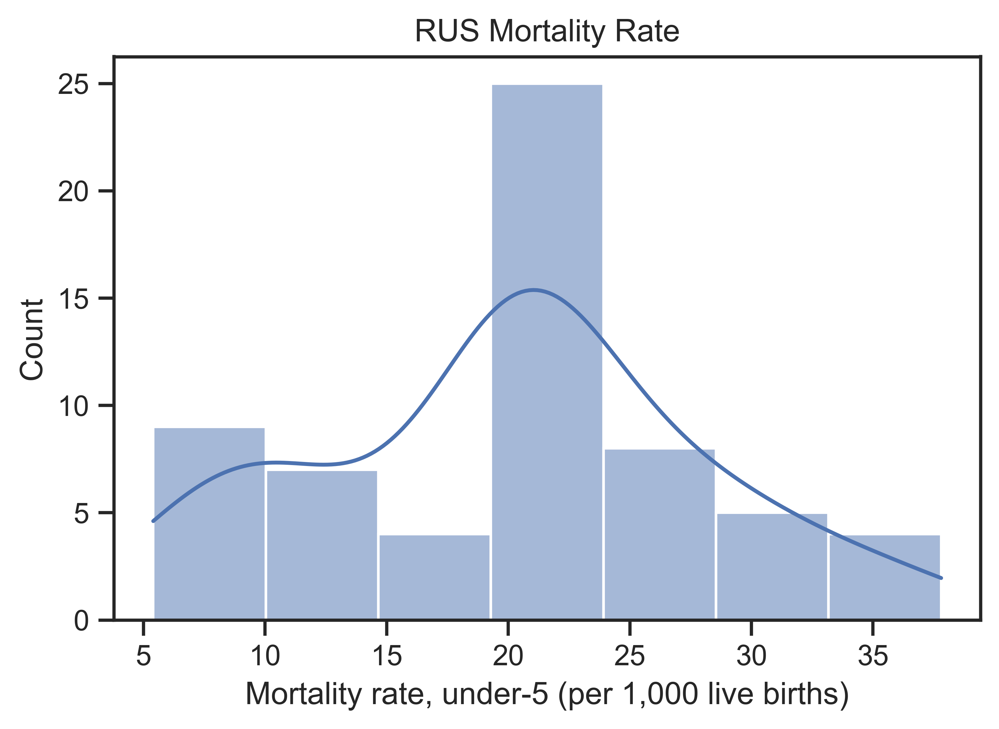

In [48]:
p = sns.histplot(data=RUS, x="SH.DYN.MORT",kde=True)
p.set(title="RUS Mortality Rate",
      xlabel="Mortality rate, under-5 (per 1,000 live births)",
      ylabel="Count")## Indicator Correlation Analysis for Russia

## 7) G20 Nations comparasion between Forest area (% of land area) and Arable land (% of land area) 

In [39]:
G20_For_Ara_land =  G20[((G20["Country Name"]=='China') |
                         (G20["Country Name"]=='India') ) & 
                        ((G20["Indicator Code"]=='AG.LND.ARBL.ZS') | 
                         (G20["Indicator Code"]=='AG.LND.FRST.ZS'))]

In [40]:
G20_For_Ara_land.head()

,Country Name,Indicator Code,1960,1961,1962,1963,1964,1965,1966,1967,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
3106,China,AG.LND.FRST.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,21.696596,21.902095,22.107595,22.313094,22.542877,22.742310,22.941735,23.141166,23.340596,NaN
3113,China,AG.LND.ARBL.ZS,NaN,10.970853,10.939340,10.918438,10.897429,10.871221,10.822732,10.771059,...,12.728202,12.707193,12.695893,12.689357,12.680817,12.678503,12.678246,NaN,NaN,NaN
8350,India,AG.LND.FRST.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,23.553422,23.643023,23.732624,23.822225,23.911825,24.001426,24.091027,24.180628,24.270228,NaN
8357,India,AG.LND.ARBL.ZS,NaN,52.403647,52.704334,52.963315,53.051436,53.214224,53.340015,53.740259,...,52.652538,52.617559,52.624622,52.608814,52.608814,52.608814,52.608814,NaN,NaN,NaN


In [41]:
G20_For_Ara_land.isnull().mean().round(4).mul(100).sort_values(ascending=False)

2021              100.0
1960              100.0
1985               50.0
1978               50.0
1979               50.0
                  ...  
1993                0.0
1992                0.0
1991                0.0
Indicator Code      0.0
1990                0.0
Length: 64, dtype: float64

### Data preprocessing: Filling missing values
---

In [42]:
# temp = G20_For_Ara_land[years]
# temp = temp.apply(lambda row: row.fillna(row.mean()), axis=1) # filling missing values by row mean
# for x in years:
#     G20_For_Ara_land[x] = temp[x]
# del temp # ensuring memory efficiency

G20_For_Ara_land = fill_missing_row(G20_For_Ara_land)

### Data Preprocesing: Feature Engineering
---

In [43]:
A_2_dataset = G20_For_Ara_land.melt(id_vars=["Country Name", "Indicator Code"], 
                                    var_name="Year", 
                                    value_name="Value")

In [44]:
A_2_dataset.head()

,Country Name,Indicator Code,Year,Value
0,China,AG.LND.FRST.ZS,1960,20.025744
1,China,AG.LND.ARBL.ZS,1960,11.958757
2,India,AG.LND.FRST.ZS,1960,22.994841
3,India,AG.LND.ARBL.ZS,1960,53.904595
4,China,AG.LND.FRST.ZS,1961,20.025744


In [45]:
A_2_dataset = A_2_dataset.astype({'Year':int})
bins = np.arange(0,A_2_dataset['Year'].max() + 5, 5)
A_2_dataset['bins'] = pd.cut(A_2_dataset['Year'], bins)
A_2_dataset.head()

,Country Name,Indicator Code,Year,Value,bins
0,China,AG.LND.FRST.ZS,1960,20.025744,"(1955, 1960]"
1,China,AG.LND.ARBL.ZS,1960,11.958757,"(1955, 1960]"
2,India,AG.LND.FRST.ZS,1960,22.994841,"(1955, 1960]"
3,India,AG.LND.ARBL.ZS,1960,53.904595,"(1955, 1960]"
4,China,AG.LND.FRST.ZS,1961,20.025744,"(1960, 1965]"


In [46]:
A_2_dataset = A_2_dataset.astype({'bins':str})
A_2_dataset['Value'] = A_2_dataset.groupby(['bins','Country Name','Indicator Code']).Value.transform('sum')
A_2_dataset.head()



,Country Name,Indicator Code,Year,Value,bins
0,China,AG.LND.FRST.ZS,1960,20.025744,"(1955, 1960]"
1,China,AG.LND.ARBL.ZS,1960,11.958757,"(1955, 1960]"
2,India,AG.LND.FRST.ZS,1960,22.994841,"(1955, 1960]"
3,India,AG.LND.ARBL.ZS,1960,53.904595,"(1955, 1960]"
4,China,AG.LND.FRST.ZS,1961,100.128721,"(1960, 1965]"


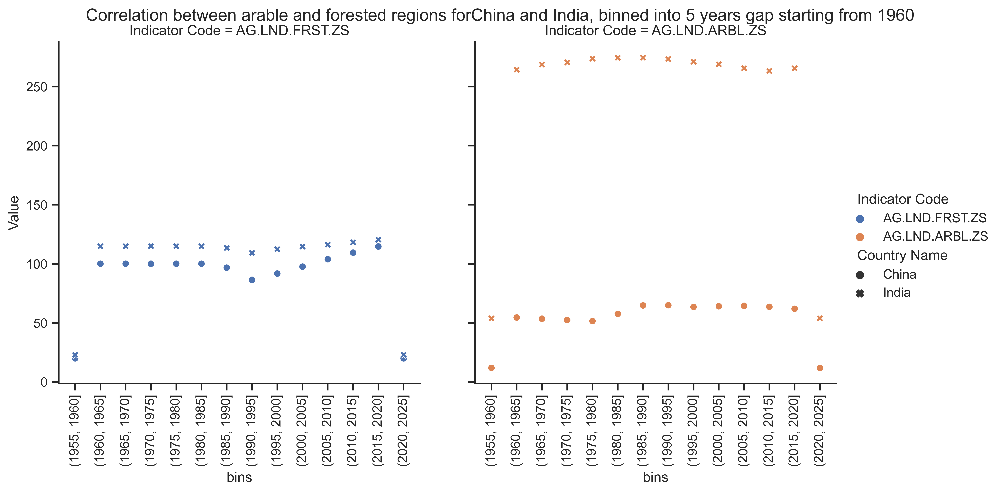

In [47]:
p=sns.relplot( data=A_2_dataset, 
              x="bins", 
              y="Value",
              col="Indicator Code", 
              hue="Indicator Code", 
              style="Country Name",
              kind="scatter")
for axes in p.axes.flat:
    _ = axes.set_xticklabels(axes.get_xticklabels(), rotation=90)

p.fig.subplots_adjust(top=0.9)
p.fig.suptitle('Correlation between arable and forested regions forChina and India, binned into 5 years gap starting from 1960')
p.savefig("output_2.png")

#### Observation:

Despite having a higher $CO_{2}$ emissin rate, there is no tangible correlation to be obseved between India and China in terms of Arable and Forested regions.